<a href="https://www.kaggle.com/code/deeplearner09/analysis-on-airbnb-listings?scriptVersionId=157829139" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

# <div style= "font-family: Cambria; font-weight:bold; letter-spacing: 0px; color:#BROWN; font-size:120%; text-align:left;padding:3.0px; background: #964B00; border-bottom: 8px solid #cc9966" > TABLE OF CONTENTS<br><div>  
    
    
* [IMPORTING LIBRARIES and DATA.](#1)
* [EXPLORATORY DATA ANALYSIS.](#2)
* [3 - DATA ANALYSIS](#3)

# <a id="1"></a>
### <div style= "font-family: Cambria; font-weight:bold; letter-spacing: 0px; color:#ffffff; font-size:120%; text-align:left;padding:3.0px; background: #964B00; border-bottom: 8px solid #cc9966" > 1 - IMPORTING LIBRARIES AND DATA.<br><div> 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
df = pd.read_csv("/kaggle/input/airbnb-listings/listings.csv")

# <a id="2"></a>
### <div style= "font-family: Cambria; font-weight:bold; letter-spacing: 0px; color:#ffffff; font-size:120%; text-align:left;padding:3.0px; background: #964B00; border-bottom: 8px solid #cc9966" >2 - EXPLORATORY DATA ANALYSIS.<br><div> 

In [3]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,number_of_reviews_ltm,license
0,5456,Guesthouse in Austin · ★4.84 · 1 bedroom · 2 b...,8028,Sylvia,NaN,78702,30.26057,-97.73441,Entire home/apt,126,2,657,2023-08-27,3.72,1,306,42,NaN
1,5769,Home in Austin · ★4.90 · 1 bedroom · 1 bed · 1...,8186,Elizabeth,NaN,78729,30.45697,-97.78422,Private room,45,1,290,2023-08-04,1.77,1,0,21,NaN
2,6413,Guesthouse in Austin · ★4.97 · Studio · 1 bed ...,13879,Todd,NaN,78704,30.24885,-97.73587,Entire home/apt,57,30,122,2022-10-17,0.73,1,0,3,NaN
3,6448,Guesthouse in Austin · ★4.97 · 1 bedroom · 2 b...,14156,Amy,NaN,78704,30.26034,-97.76487,Entire home/apt,159,3,305,2023-09-04,2.09,1,156,17,NaN
4,8502,Guest suite in Austin · ★4.56 · 1 bedroom · 1 ...,25298,Karen,NaN,78741,30.23466,-97.73682,Entire home/apt,48,4,51,2023-05-16,0.31,1,98,3,NaN


In [4]:
# Dropping the neighbourhood_group.
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14861 entries, 0 to 14860
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              14861 non-null  int64  
 1   name                            14861 non-null  object 
 2   host_id                         14861 non-null  int64  
 3   host_name                       14859 non-null  object 
 4   neighbourhood_group             0 non-null      float64
 5   neighbourhood                   14861 non-null  int64  
 6   latitude                        14861 non-null  float64
 7   longitude                       14861 non-null  float64
 8   room_type                       14861 non-null  object 
 9   price                           14861 non-null  int64  
 10  minimum_nights                  14861 non-null  int64  
 11  number_of_reviews               14861 non-null  int64  
 12  last_review                     

In [5]:
missing_count = df.isnull().sum()
missing_count

id                                    0
name                                  0
host_id                               0
host_name                             2
neighbourhood_group               14861
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                        3103
reviews_per_month                  3103
calculated_host_listings_count        0
availability_365                      0
number_of_reviews_ltm                 0
license                           14861
dtype: int64

In [6]:
df_cleaned = df.dropna()


In [7]:
median_price = df['price'].median()
df['price'].fillna(median_price, inplace=True)

In [8]:
df_cleaned = df.drop_duplicates()


In [9]:
df_cleaned['latitude'] = df_cleaned['latitude'].astype(float)
df_cleaned['longitude'] = df_cleaned['longitude'].astype(float)


# <a id="3"></a>
### <div style= "font-family: Cambria; font-weight:bold; letter-spacing: 0px; color:#ffffff; font-size:120%; text-align:left;padding:3.0px; background: #964B00; border-bottom: 8px solid #cc9966" >3 - ANALYSIS ON DATA.<br><div> 

## 1 - Descriptive Statistics:



In [10]:
# Summary statistics for numeric columns
summary_stats = df.describe()

# Median price
median_price = df['price'].median()

# Mode of room types
mode_room_type = df['room_type'].mode().iloc[0]



## 2 - Distribution of Room Types:



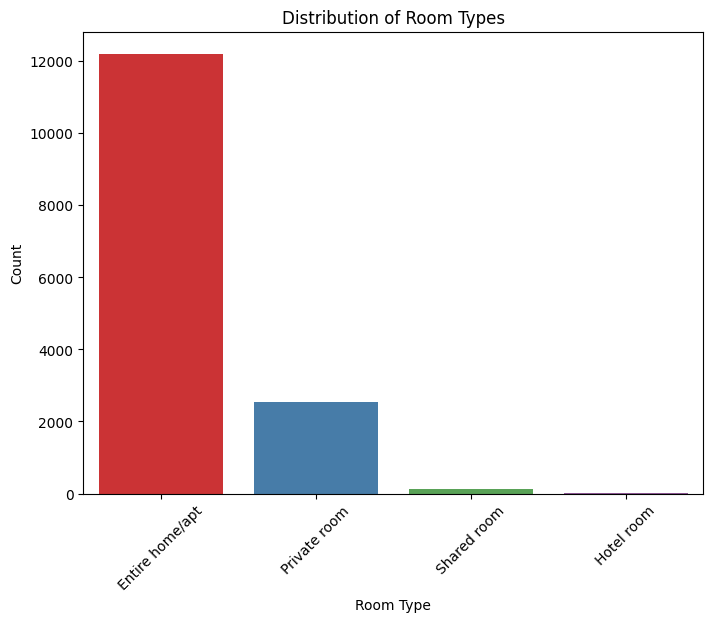

In [11]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x='room_type', palette='Set1')
plt.title('Distribution of Room Types')
plt.xlabel('Room Type')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


## 3 - Price Distribution:



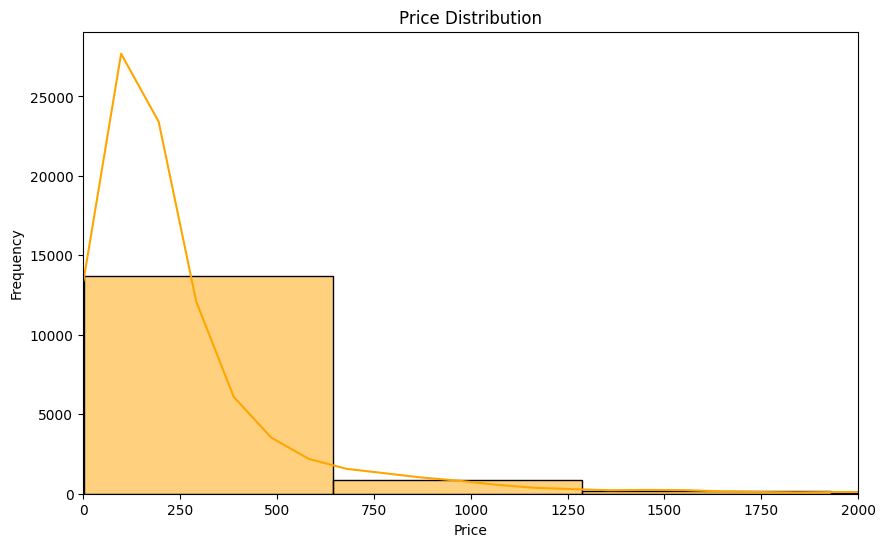

In [12]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=30, kde=True, color='orange')
plt.title('Price Distribution')
plt.xlabel('Price')
plt.ylabel('Frequency')
plt.xlim(0, 2000)  # Set x-axis limits
plt.show()


## 4 - Average Price by Room Type:



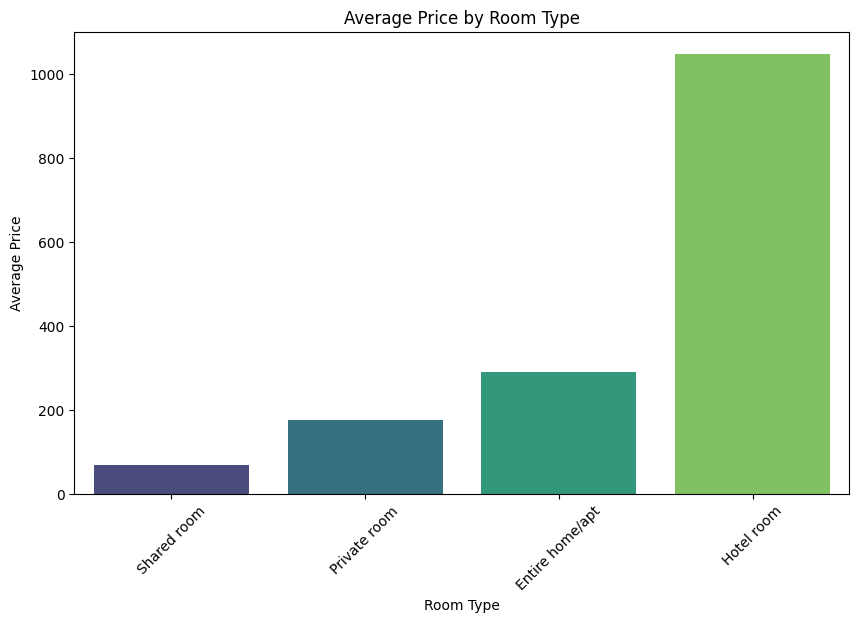

In [13]:
avg_price_by_room_type = df.groupby('room_type')['price'].mean().sort_values()

plt.figure(figsize=(10, 6))
sns.barplot(x=avg_price_by_room_type.index, y=avg_price_by_room_type.values, palette='viridis')
plt.title('Average Price by Room Type')
plt.xlabel('Room Type')
plt.ylabel('Average Price')
plt.xticks(rotation=45)
plt.show()


## 5 - Geospatial Analysis 

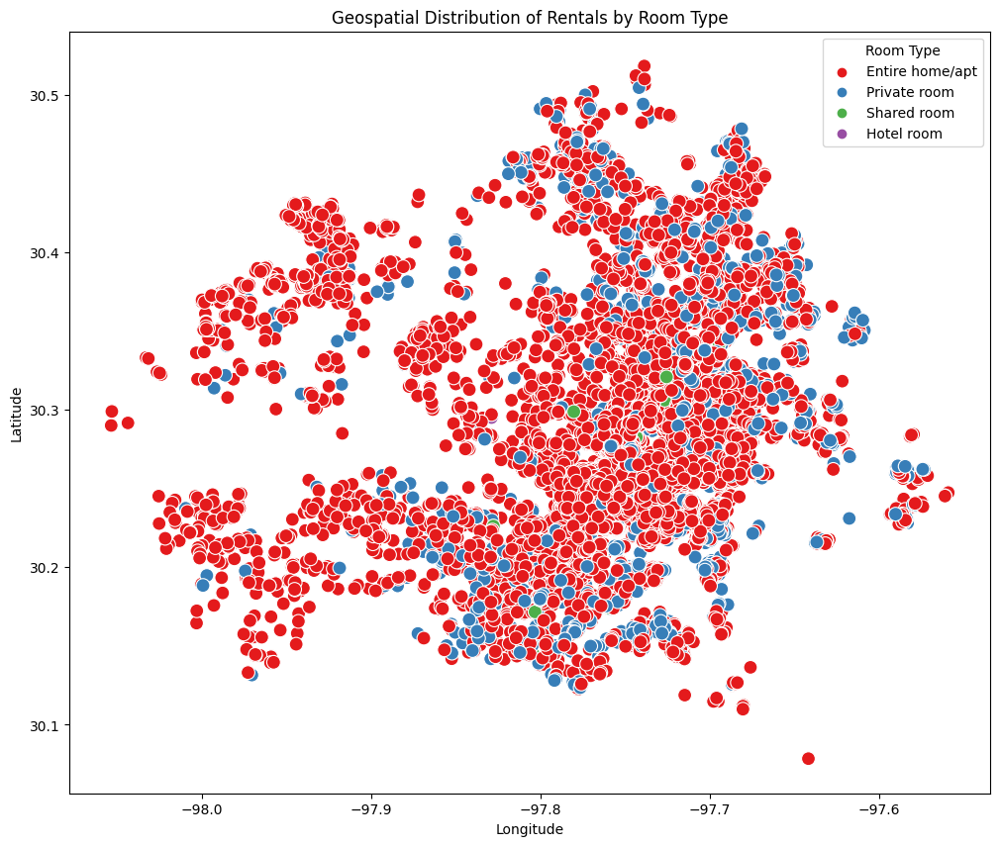

In [14]:
plt.figure(figsize=(12, 10))
sns.scatterplot(data=df, x='longitude', y='latitude', hue='room_type', palette='Set1', s=100)
plt.title('Geospatial Distribution of Rentals by Room Type')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend(title='Room Type', loc='upper right')
plt.show()


## 6 - Correlation Analysis 

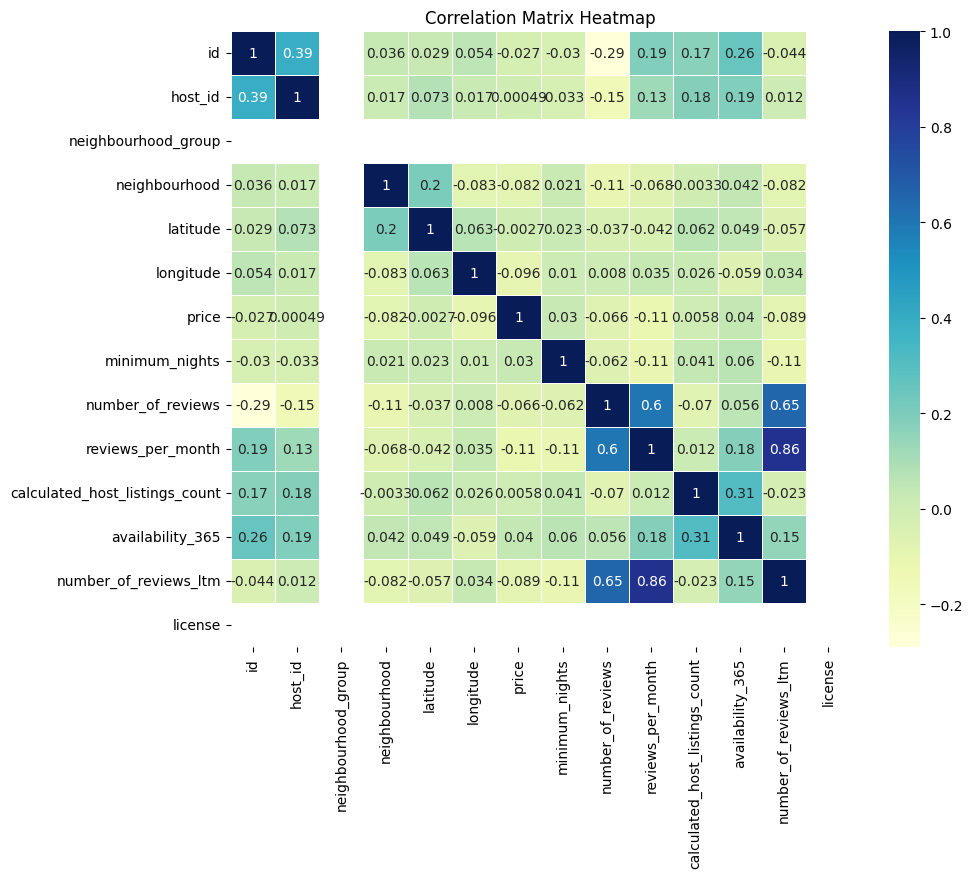

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

# Extracting numeric columns
numeric_columns = df.select_dtypes(include=['number'])

# Correlation analysis for numeric columns
correlation_matrix = numeric_columns.corr()

# Create a heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='YlGnBu', linewidths=.5)
plt.title('Correlation Matrix Heatmap')
plt.show()


# 7 - Top Hosts:

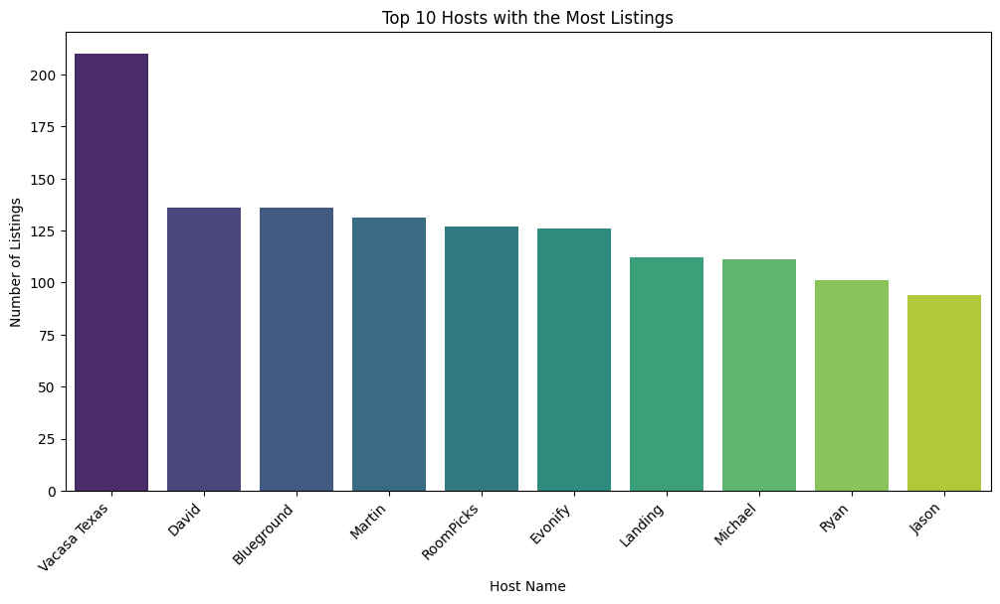

In [16]:
# Top hosts
top_hosts = df['host_name'].value_counts().head(10)

# Create a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x=top_hosts.index, y=top_hosts.values, palette="viridis")
plt.title('Top 10 Hosts with the Most Listings')
plt.xlabel('Host Name')
plt.ylabel('Number of Listings')
plt.xticks(rotation=45, ha='right')
plt.show()

# 8 - Geospatial - 2.0 (CLUSTER USING CENTROIDS):

In [17]:
import folium
from folium.plugins import MarkerCluster

# Create a map centered around the mean latitude and longitude
map_center = [df['latitude'].mean(), df['longitude'].mean()]
mymap = folium.Map(location=map_center, zoom_start=12)

# Create a MarkerCluster
marker_cluster = MarkerCluster().add_to(mymap)

# Add markers for each listing to the cluster
for index, row in df.iterrows():
    folium.Marker(
        [row['latitude'], row['longitude']],
        popup=f"{row['name']} - {row['room_type']}",
    ).add_to(marker_cluster)

# Display the map
mymap


# Deep Learning . (UC : 5-1-24) 

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.metrics import mean_squared_error
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense